In [2]:
# Importing packages
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import sklearn
from plotly.subplots import make_subplots
import plotly.figure_factory as ff

#import tensorflow as tf

import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.api import ExponentialSmoothing
from arch import arch_model

import pmdarima as pm
import pylab

import scipy.fft
from scipy.fft import fft, fftfreq, ifft,  rfft, rfftfreq
from scipy import stats
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

import seaborn as sns
sns.set_style('darkgrid')

from datetime import timedelta

#import tensorflow as tf
#keras = tf.keras

%matplotlib inline 
#notebook

In [3]:
# Reading pvwatt data
df = pd.read_csv("../dataset/pvwatts_hourly.csv", skiprows=30)
df.head(5)

,Month,Day,Hour,Beam Irradiance (W/m2),Diffuse Irradiance (W/m2),Ambient Temperature (C),Wind Speed (m/s),Albedo,Plane of Array Irradiance (kW/m2),Cell Temperature (C),DC Array Output (W),AC System Output (W)
0,1,1,0,0,0,16.0,0.5,0.27,0.0,16.0,0.0,0.0
1,1,1,1,0,0,15.6,2.1,0.27,0.0,15.6,0.0,0.0
2,1,1,2,0,0,15.1,2.1,0.27,0.0,15.1,0.0,0.0
3,1,1,3,0,0,14.8,2.1,0.27,0.0,14.8,0.0,0.0
4,1,1,4,0,0,14.4,1.0,0.27,0.0,14.4,0.0,0.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 12 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Month                              8760 non-null   int64  
 1   Day                                8760 non-null   int64  
 2   Hour                               8760 non-null   int64  
 3   Beam Irradiance (W/m2)             8760 non-null   int64  
 4   Diffuse Irradiance (W/m2)          8760 non-null   int64  
 5   Ambient Temperature (C)            8760 non-null   float64
 6   Wind Speed (m/s)                   8760 non-null   float64
 7   Albedo                             8760 non-null   float64
 8   Plane of Array Irradiance (kW/m2)  8760 non-null   float64
 9   Cell Temperature (C)               8760 non-null   float64
 10  DC Array Output (W)                8760 non-null   float64
 11  AC System Output (W)               8760 non-null   float

In [5]:
df.describe()

,Month,Day,Hour,Beam Irradiance (W/m2),Diffuse Irradiance (W/m2),Ambient Temperature (C),Wind Speed (m/s),Albedo,Plane of Array Irradiance (kW/m2),Cell Temperature (C),DC Array Output (W),AC System Output (W)
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,6.526027,15.720548,11.500000,261.977397,69.260731,27.135297,3.644521,0.241479,268.960170,31.379833,1684.112963,1608.241745
std,3.448048,8.796749,6.922582,343.125973,88.571262,7.394359,2.252985,0.025772,356.446872,12.609671,2216.293048,2125.999656
min,1.000000,1.000000,0.000000,0.000000,0.000000,5.000000,0.000000,0.190000,0.000000,0.000000,0.000000,0.000000
25%,4.000000,8.000000,5.750000,0.000000,0.000000,21.500000,2.100000,0.210000,0.000000,22.399750,0.000000,0.000000
50%,7.000000,16.000000,11.500000,0.000000,10.000000,27.000000,3.100000,0.250000,9.248000,29.805000,35.860000,2.880500
75%,10.000000,23.000000,17.250000,605.000000,132.000000,32.500000,5.100000,0.260000,582.445750,39.314250,3783.695250,3617.915750
max,12.000000,31.000000,23.000000,975.000000,538.000000,47.000000,24.200000,0.270000,1077.771000,77.531000,6897.414000,6621.303000


In [6]:
# Adding year column and datetime column
df['year'] = 2022
#df['datetime'] = pd.to_datetime(year = '2022', month = 'Month', day = 'Day', hour = 'Hour')
df['datetime'] = pd.to_datetime(df[['year', 'Month', 'Day', 'Hour']])
#df = df.set_index(['datetime'])
df.head(4)

,Month,Day,Hour,Beam Irradiance (W/m2),Diffuse Irradiance (W/m2),Ambient Temperature (C),Wind Speed (m/s),Albedo,Plane of Array Irradiance (kW/m2),Cell Temperature (C),DC Array Output (W),AC System Output (W),year,datetime
0,1,1,0,0,0,16.0,0.5,0.27,0.0,16.0,0.0,0.0,2022,2022-01-01 00:00:00
1,1,1,1,0,0,15.6,2.1,0.27,0.0,15.6,0.0,0.0,2022,2022-01-01 01:00:00
2,1,1,2,0,0,15.1,2.1,0.27,0.0,15.1,0.0,0.0,2022,2022-01-01 02:00:00
3,1,1,3,0,0,14.8,2.1,0.27,0.0,14.8,0.0,0.0,2022,2022-01-01 03:00:00


In [7]:
df.columns

Index(['Month', 'Day', 'Hour', 'Beam Irradiance (W/m2)',
       'Diffuse Irradiance (W/m2)', 'Ambient Temperature (C)',
       'Wind Speed (m/s)', 'Albedo', 'Plane of Array Irradiance (kW/m2)',
       'Cell Temperature (C)', 'DC Array Output (W)', 'AC System Output (W)',
       'year', 'datetime'],
      dtype='object')

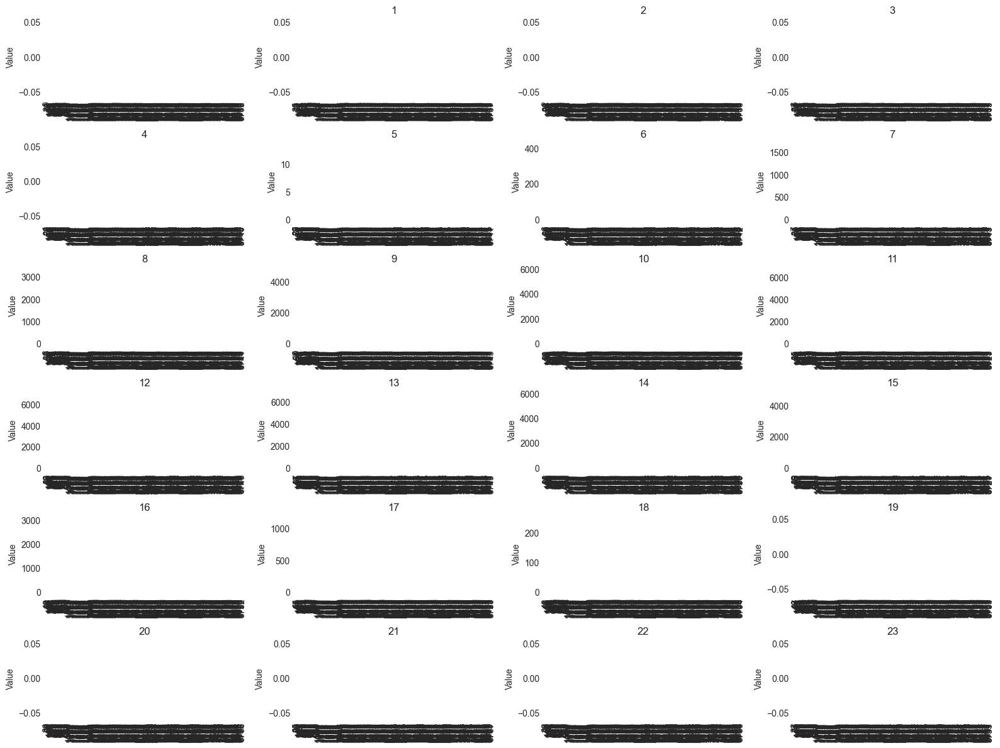

In [19]:
grouped_df = df.groupby('Hour')

fig, axs = plt.subplots(nrows=6, ncols=4, figsize=(16, 12))

# flatten the axs array for easier indexing
axs = axs.flatten()

# loop through each group and plot it on its corresponding subplot
for i, group in enumerate(grouped_df.groups):
    data = grouped_df['DC Array Output (W)'].get_group(group)
    data.plot(ax=axs[i], kind='line', title=group)
    axs[i].set_xlabel('datetime')
    axs[i].set_ylabel('DC Array Output (W)')

# adjust the layout and spacing of the subplots
plt.tight_layout()

# show the plot
plt.show()

/var/folders/m4/y98c53d15dg1mt8b2xxsb6s40000gn/T/ipykernel_9570/687212037.py:9: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  fig.tight_layout()


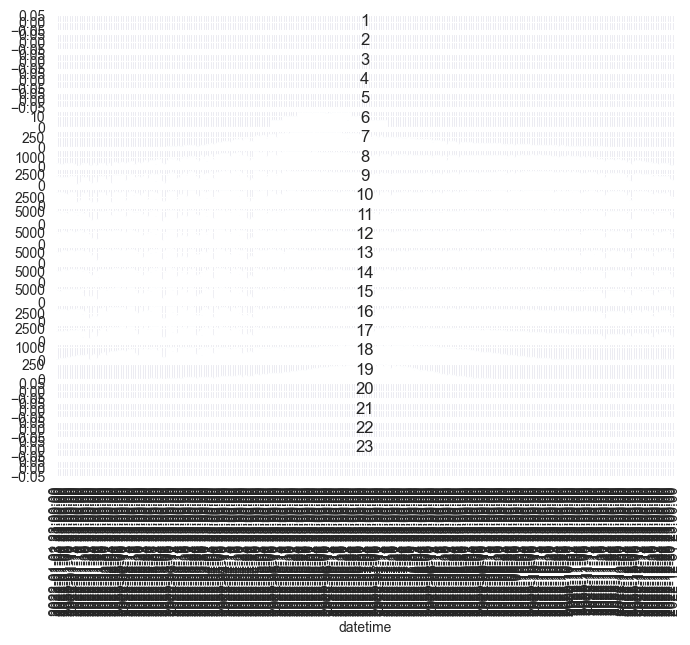

In [12]:
g = df.groupby('Hour')

fig, axes = plt.subplots(g.ngroups, sharex=True, figsize=(8, 6))

for i, (Hr, d) in enumerate(g):
    ax = d.plot.bar(x='datetime', y='DC Array Output (W)', ax=axes[i], title=Hr)
    ax.legend().remove()

fig.tight_layout()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


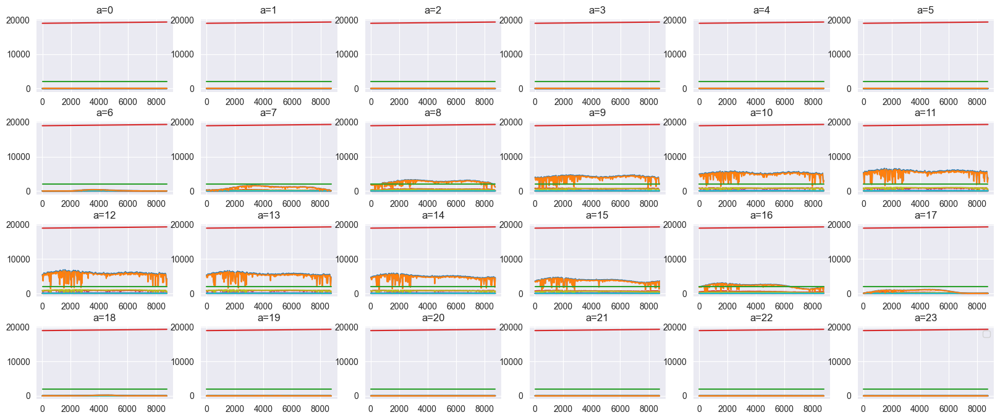

In [11]:
grouped = df.groupby('Hour')
rowlength = int(grouped.ngroups/4)                       # fix up if odd number of groups
fig, axs = plt.subplots(figsize=(20,8), 
                        nrows=int(grouped.ngroups/rowlength), ncols=rowlength,     # fix as above
                        gridspec_kw=dict(hspace=0.4)) # Much control of gridspec

targets = zip(grouped.groups.keys(), axs.flatten())
for i, (key, ax) in enumerate(targets):
    ax.plot(grouped.get_group(key))
    ax.set_title('a=%d'%key)
ax.legend()
plt.show()

In [8]:

# group the data by 'Category' and 'Hour'
grouped = df.groupby(['DC Array Output (W)', 'Hour'])

# create a figure with subplots for each group
fig, axs = plt.subplots(nrows=len(grouped), ncols=1, figsize=(10,20))

# loop through each group and plot on its corresponding subplot
for i, ((name1, name2), group) in enumerate(grouped):
    group.plot(ax=axs[i], kind='line', x='Timestamp', y='Value', title=name1 + ' - Hour ' + str(name2))
    axs[i].set_xlabel('')
    axs[i].set_ylabel('Value')

# set the title of the entire figure
fig.suptitle('Value by Category and Hour')

# adjust the layout and spacing of the subplots
plt.tight_layout()

# show the plot
plt.show()

UFuncTypeError: ufunc 'add' did not contain a loop with signature matching types (dtype('float64'), dtype('<U8')) -> None

Error in callback <function _draw_all_if_interactive at 0x10fc37b80> (for post_execute):


KeyboardInterrupt: 

In [7]:
var_cals_list = ['Beam Irradiance (W/m2)',
       'Diffuse Irradiance (W/m2)', 'Ambient Temperature (C)',
       'Wind Speed (m/s)', 'Albedo', 'Plane of Array Irradiance (kW/m2)',
       'Cell Temperature (C)', 'DC Array Output (W)', 'AC System Output (W)']
for col in var_cals_list:
    fig = px.line(df, x = 'datetime', y = col, title= str(col) + "days")
    fig.show()

## Hourly Analysis

In [8]:
# create scatter plot with subplots using Plotly Express
for col in var_cals_list :
    fig = px.line(df, x='datetime', y=col, color='Hour', facet_col='Hour', title='Subplots of '+str(col)+ ' Grouped Data')
    fig
    # show plot
    fig.show()

<Figure size 640x480 with 0 Axes>

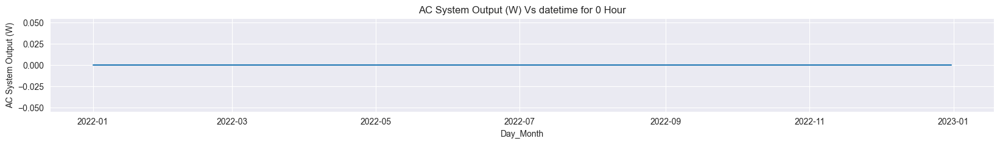

<Figure size 640x480 with 0 Axes>

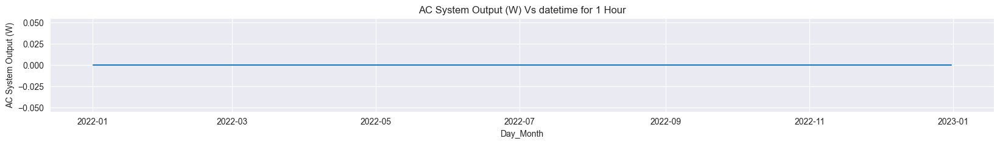

<Figure size 640x480 with 0 Axes>

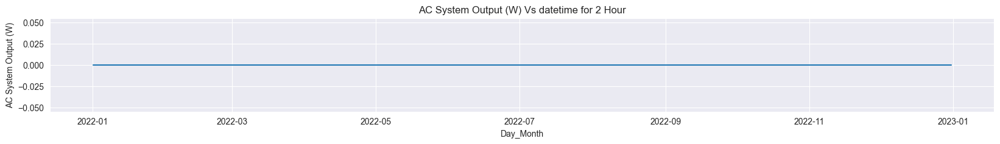

<Figure size 640x480 with 0 Axes>

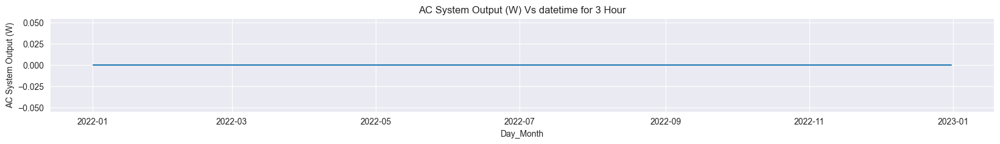

<Figure size 640x480 with 0 Axes>

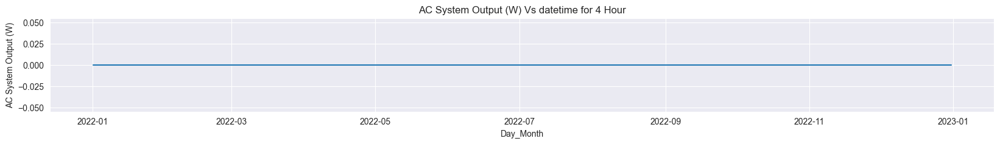

<Figure size 640x480 with 0 Axes>

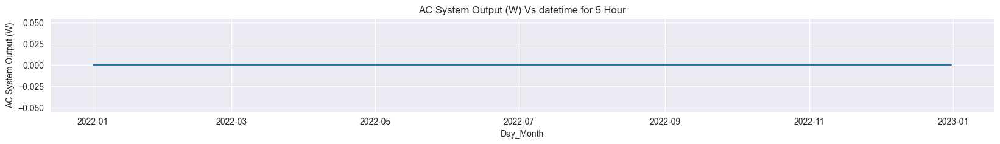

<Figure size 640x480 with 0 Axes>

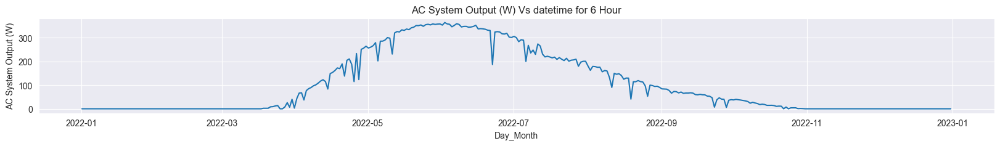

<Figure size 640x480 with 0 Axes>

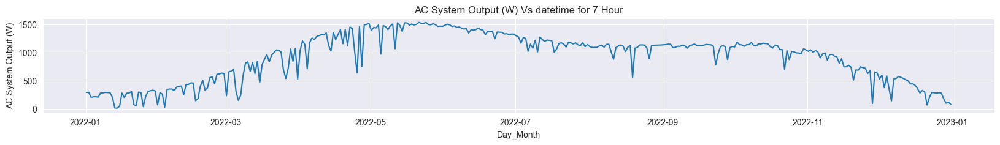

<Figure size 640x480 with 0 Axes>

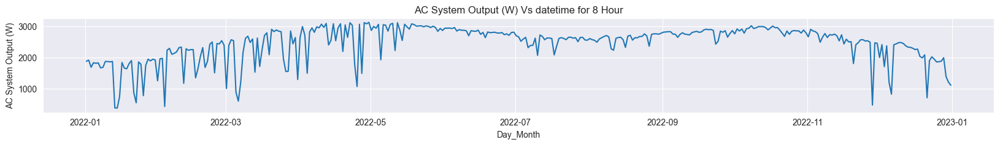

<Figure size 640x480 with 0 Axes>

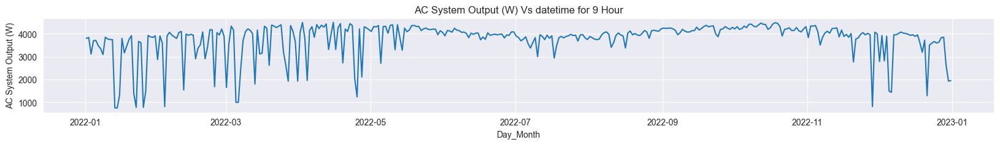

<Figure size 640x480 with 0 Axes>

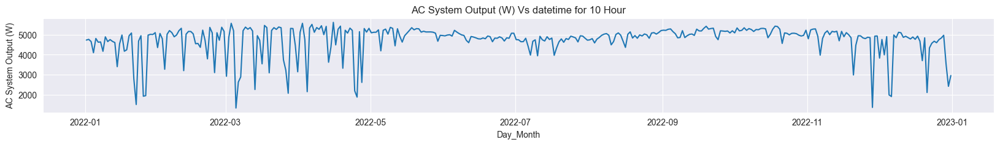

<Figure size 640x480 with 0 Axes>

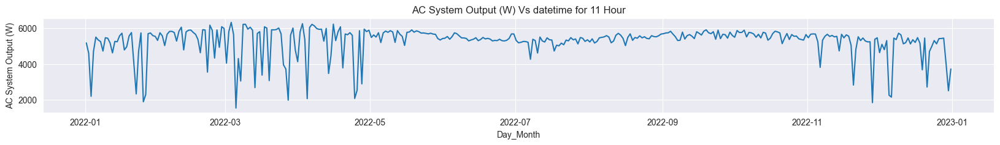

<Figure size 640x480 with 0 Axes>

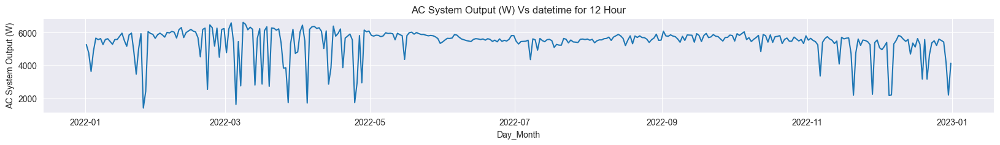

<Figure size 640x480 with 0 Axes>

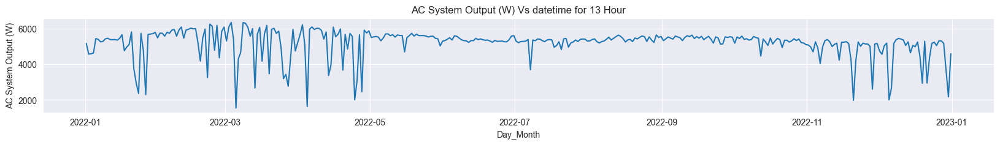

<Figure size 640x480 with 0 Axes>

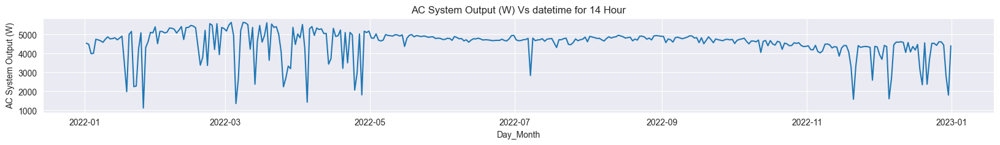

<Figure size 640x480 with 0 Axes>

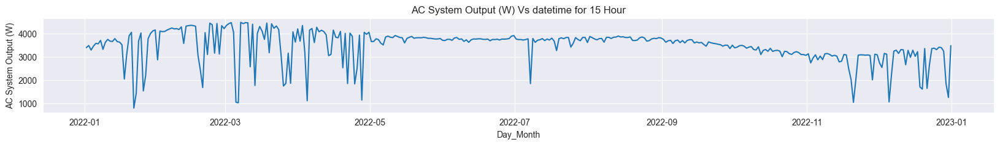

<Figure size 640x480 with 0 Axes>

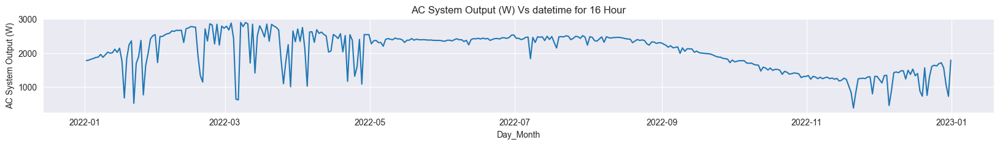

<Figure size 640x480 with 0 Axes>

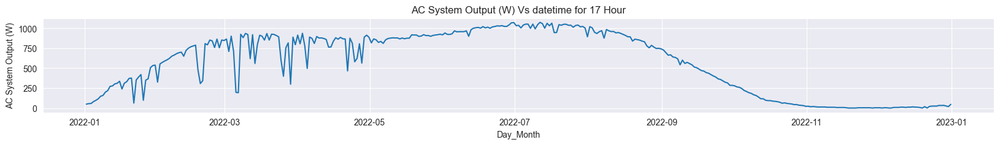

<Figure size 640x480 with 0 Axes>

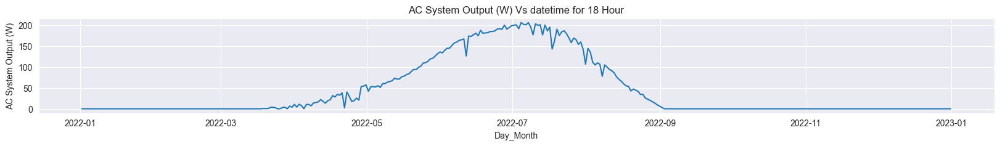

<Figure size 640x480 with 0 Axes>

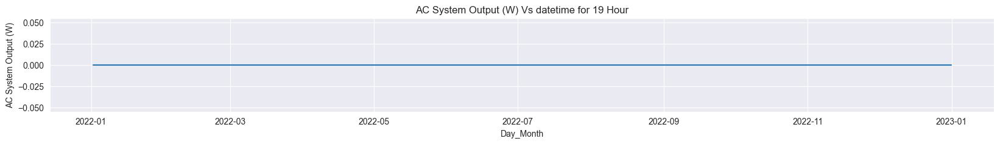

<Figure size 640x480 with 0 Axes>

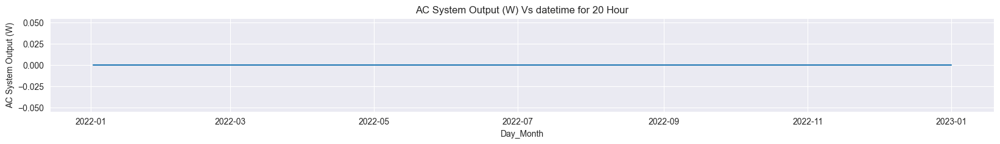

<Figure size 640x480 with 0 Axes>

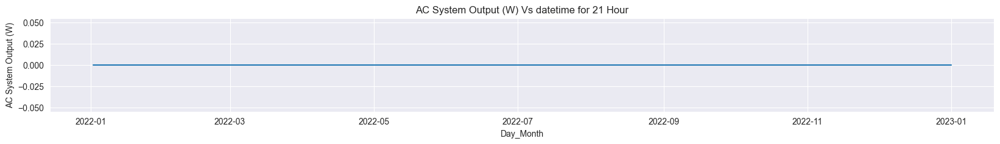

<Figure size 640x480 with 0 Axes>

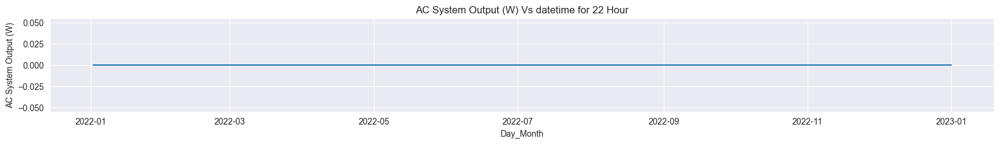

<Figure size 640x480 with 0 Axes>

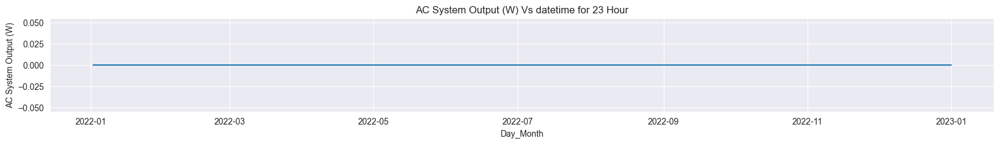

In [9]:
for hr, df_hr in enumerate(df.groupby('Hour')):
    plt.figure()
    fig = plt.figure(figsize=(20, 2))
    plt.plot(df_hr[1]['datetime'], df_hr[1]['AC System Output (W)'])
    plt.xlabel('Day_Month')
    plt.ylabel("AC System Output (W)")
    plt.title("AC System Output (W) Vs datetime for "+ str(hr) + " Hour")
    plt.show()

### ACF and PACF correlation a

/Users/harshayarravarapu/Library/Python/3.9/lib/python/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



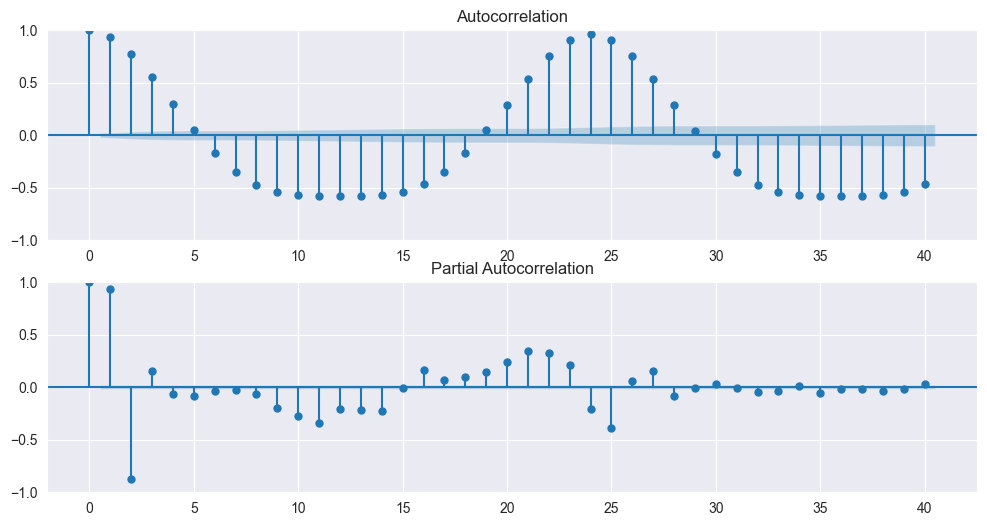

In [10]:
# ACF and PACF plots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12,6))
plot_acf(df['DC Array Output (W)'], ax=ax1)
plot_pacf(df['DC Array Output (W)'], ax=ax2)

plt.show()

### One Lag Time Differencing

<AxesSubplot: >

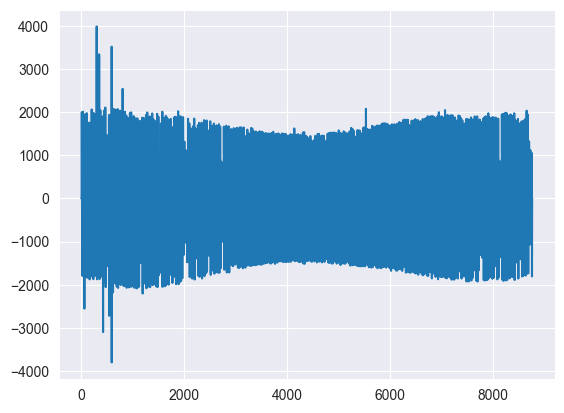

In [11]:
df_diff=df['DC Array Output (W)'] - df['DC Array Output (W)'].shift()
df_diff.plot()

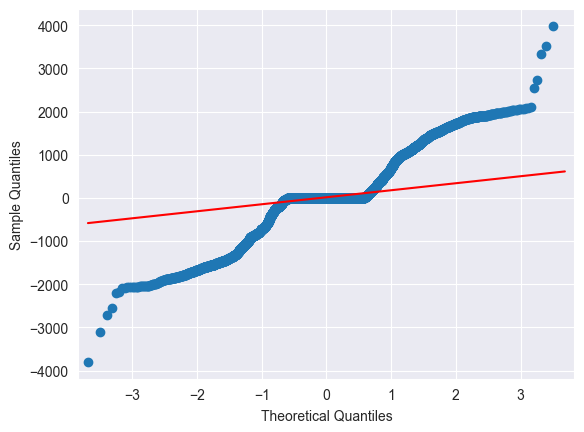

In [12]:
sm.qqplot(df_diff, line='q');

### High auto-correlation value is observed for lag 1 and lag 24 in ACF plot
### Significant Partial auto correlation for lags 1,2,25 in PACF plots

## Checking Stationarity of time series
### A Stationary series is one whose statistical properties such as mean, variance, covariance, and standard deviation do not vary with time, or these stats properties are not a function of time. In other words, stationarity in Time Series also means series without a Trend or Seasonal components

In [13]:
# Call the function and run the test
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)

adf_test(df['DC Array Output (W)'])    

Results of Dickey-Fuller Test:
Test Statistic                -1.214441e+01
p-value                        1.623184e-22
#Lags Used                     3.700000e+01
Number of Observations Used    8.722000e+03
Critical Value (1%)           -3.431100e+00
Critical Value (5%)           -2.861871e+00
Critical Value (10%)          -2.566946e+00
dtype: float64


## Hypothesis is Time series is stationary
### p-value > 0.05 : Fail to reject the null hypothesis of the statistical test. => Time series is stationary
### p-value <= 0.05 : Reject the null hypothesis of the statistical test. => Time series is non-stationary



# Seasonal Decomposition
### y(t) = trend + seasonality + residual(noise) -> additive trend
### y(t) = trend*seasonality*residual -> Multiplicative trend

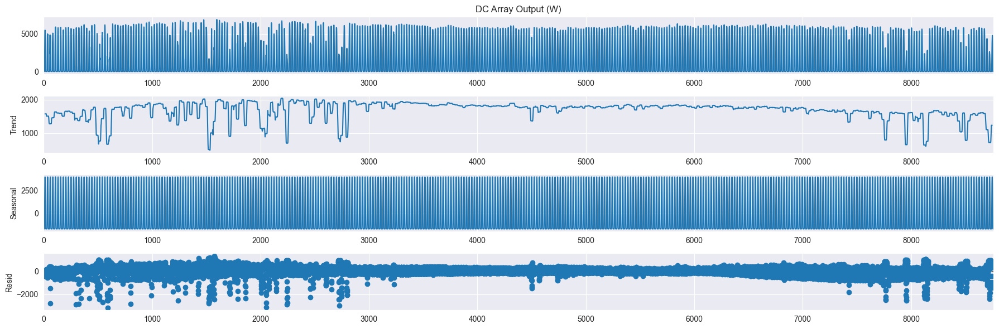

In [14]:
#Seaosnal decomposition
def seasonal_decomposition(series, model_type, period):
    results = seasonal_decompose(series, model = model_type, period = period)
    plt.rcParams["figure.figsize"] = (18, 6)
    results.plot()
    plt.show()

seasonal_decomposition(df['DC Array Output (W)'], model_type = 'additive', period = 24)

# Simple Moving Average

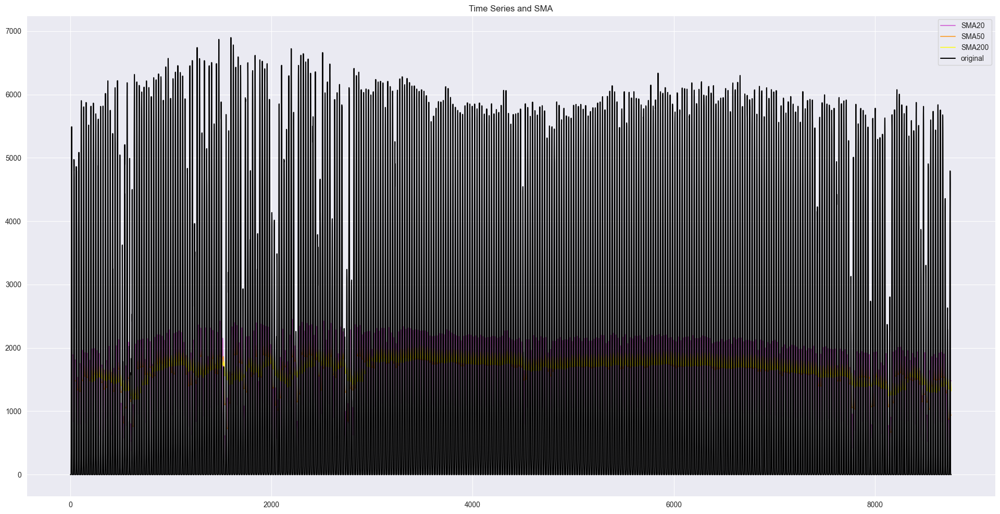

In [15]:
sma={}
for k in [20, 50, 200]:
    sma[k]=df['DC Array Output (W)'].rolling(k).mean()

plt.figure()
sma[20].plot(color='m', label='SMA20',  figsize=(24,12),alpha=0.5,  animated=True)
sma[50].plot(color='darkorange', label='SMA50', alpha=0.7,  animated=True)
sma[200].plot(color='yellow', label='SMA200',alpha=0.7,    animated=True)
df['DC Array Output (W)'].plot(color='black',   alpha=1, label='original')
plt.title('Time Series and SMA')
plt.legend(loc='best')
plt.show()

# ARIMA

In [16]:
results = {}
model = pm.auto_arima(df['DC Array Output (W)'], start_p=1, start_q=1, start_d = 1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=25, max_q=25,max_d =3, # maximum p and q
                      m=1,              # frequency of series
                   #   d=0,           # let model determine 'd'
                      seasonal=False,   # No Seasonality
                      start_P=0, 
                  #    D=0, 
                  #    information_criterion='aic', # default, (‘aic’, ‘bic’, ‘hqic’, ‘oob’
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

print(model.summary())

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=134428.758, Time=0.60 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=163820.786, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=141255.461, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=152703.290, Time=0.41 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=129486.524, Time=0.35 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=130061.818, Time=0.14 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=129368.367, Time=0.52 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=129384.616, Time=0.32 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=inf, Time=1.82 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=1.90 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=129395.173, Time=0.43 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=129372.544, Time=0.40 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=129343.029, Time=1.91 sec
 ARIMA(5,0,2)(0,0,0)[0]             : AIC=129204.385, Time=2.74 sec
 ARIMA(5,0,1)(0,0,0

### Best model:  ARIMA(14,0,3)(0,0,0)[0]

In [17]:
## Fitting the model
arima_model = sm.tsa.statespace.SARIMAX(df['DC Array Output (W)'], order = (14,0,3))
model_fit = arima_model.fit(return_params =0)
print(model.summary())

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           18     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.37477D+00    |proj g|=  1.41040D-01


 This problem is unconstrained.



At iterate    5    f=  7.34920D+00    |proj g|=  4.54594D-02

At iterate   10    f=  7.30462D+00    |proj g|=  2.38091D-01

At iterate   15    f=  7.27018D+00    |proj g|=  3.59534D-02

At iterate   20    f=  7.24343D+00    |proj g|=  4.49637D-02

At iterate   25    f=  7.24041D+00    |proj g|=  1.16365D-02

At iterate   30    f=  7.23777D+00    |proj g|=  2.70123D-02

At iterate   35    f=  7.23707D+00    |proj g|=  2.31711D-02

At iterate   40    f=  7.23663D+00    |proj g|=  9.90600D-03

At iterate   45    f=  7.23615D+00    |proj g|=  2.08757D-02


/Users/harshayarravarapu/Library/Python/3.9/lib/python/site-packages/statsmodels/base/model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals




At iterate   50    f=  7.23588D+00    |proj g|=  4.27126D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   18     50     59      1     0     0   4.271D-02   7.236D+00
  F =   7.2358803084542380     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 8760
Model:              SARIMAX(14, 0, 3)   Log Likelihood              -62412.437
Date:                Mon, 01 May 2023   AIC                         124862.875
Time:                        10:37:42   BIC  

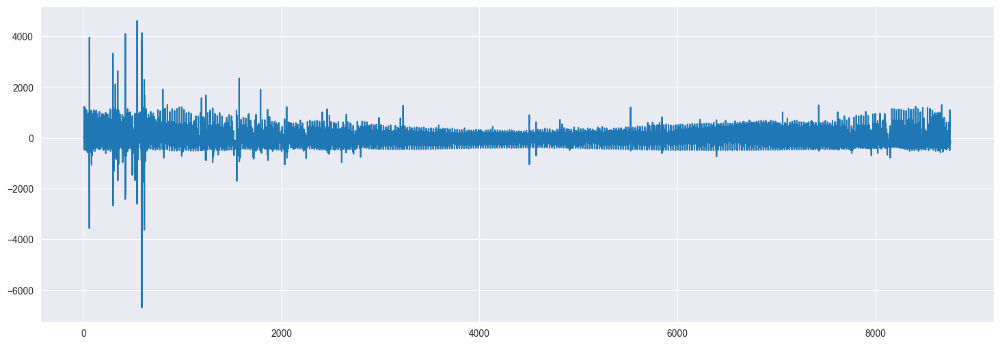

In [18]:
residuals = model_fit.resid[1:]
plt.figure()
residuals.plot();

<AxesSubplot: >

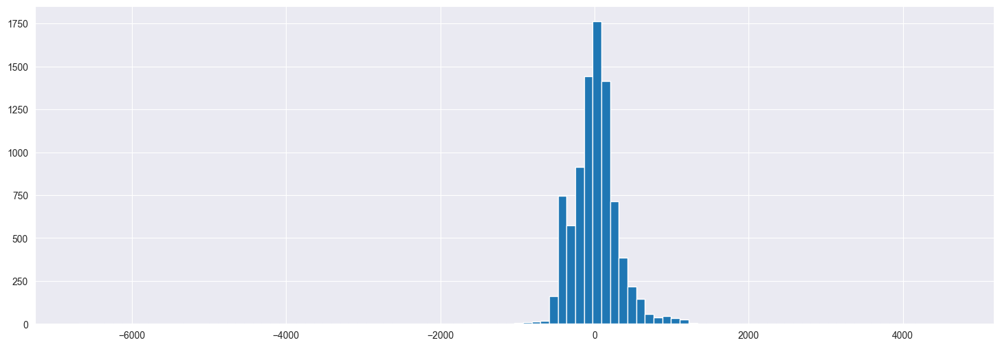

In [19]:
plt.figure()
residuals.hist(bins=100)

In [20]:
residuals.describe()

count    8759.000000
mean        8.852972
std       331.882946
min     -6691.560272
25%      -157.985343
50%         7.417171
75%       152.326898
max      4611.384371
dtype: float64

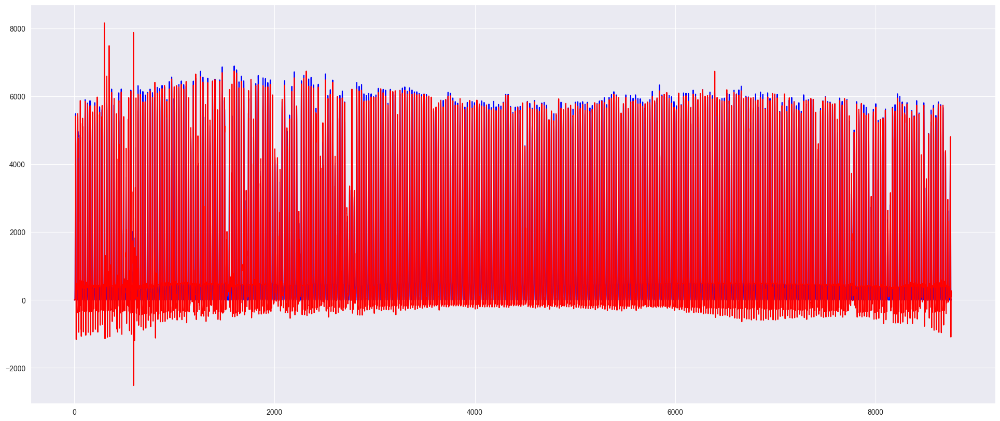

In [21]:
# Actual vs Fitted
df['DC Array Output (W)'].plot(color='b', label='actual');
model_fit.predict().plot(figsize=(24,10), color='r', label='ARIMA')
plt.show()

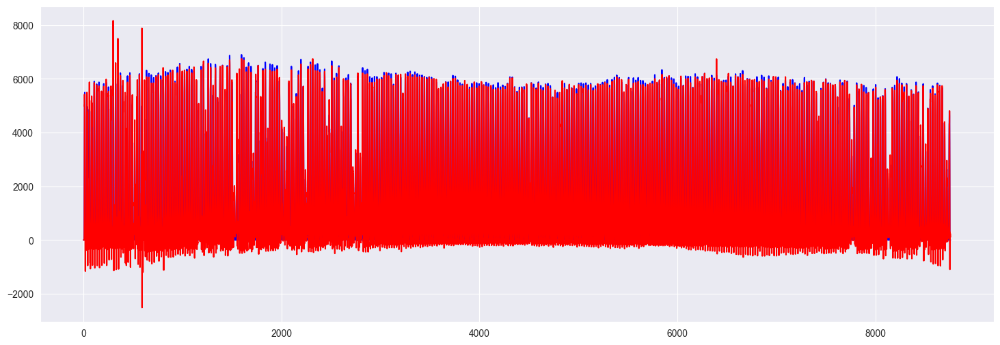

In [22]:
# Alternative way to plot them

df['DC Array Output (W)'].plot(color='b', label='actual');
model_fit.fittedvalues.plot(color='r');
plt.show();

In [23]:
# evaluate forecasts
mse = (mean_squared_error(df['DC Array Output (W)'], model_fit.predict()  ))
print('Test MSE: %.3f' % mse)

mae = (mean_absolute_error(df['DC Array Output (W)'], model_fit.predict()  ))
print('Test MAE: %.3f' % mae)

Test MSE: 110199.508
Test MAE: 220.090


## GARCH

In [24]:
am = arch_model(df['DC Array Output (W)'])
res = am.fit(update_freq=5)
print(res.summary())

Iteration:      5,   Func. Count:     27,   Neg. LLF: 78882.11228411827
Iteration:     10,   Func. Count:     52,   Neg. LLF: 77594.83153144472
Iteration:     15,   Func. Count:     81,   Neg. LLF: 77584.29437785657
Optimization terminated successfully    (Exit mode 0)
            Current function value: 77584.29437785657
            Iterations: 20
            Function evaluations: 85
            Gradient evaluations: 16
                      Constant Mean - GARCH Model Results                      
Dep. Variable:     DC Array Output (W)   R-squared:                       0.000
Mean Model:              Constant Mean   Adj. R-squared:                  0.000
Vol Model:                       GARCH   Log-Likelihood:               -77584.3
Distribution:                   Normal   AIC:                           155177.
Method:             Maximum Likelihood   BIC:                           155205.
                                         No. Observations:                 8760
Date:          

/Users/harshayarravarapu/Library/Python/3.9/lib/python/site-packages/arch/univariate/base.py:310: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 4.911e+06. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 0.01 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.




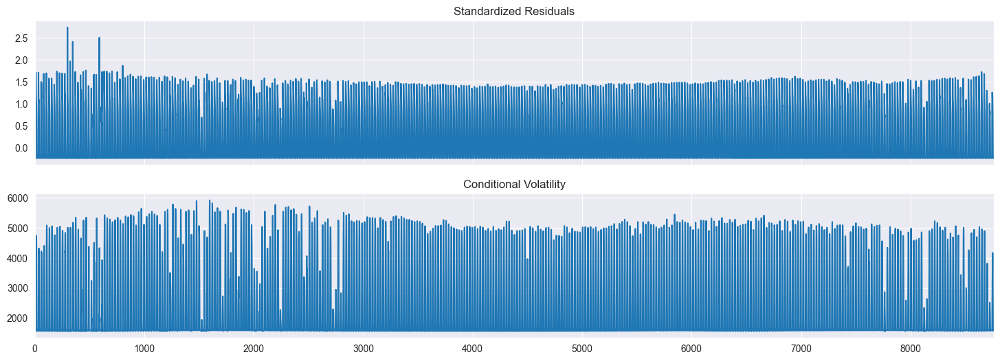

In [25]:
garcgfig=res.plot()


# II. Forecasting and Backtesting
## Split the dataset: Train/test set


In [31]:
# split into train and test sets

#df = df.set_index('datetime')
df.head(4)


,Month,Day,Hour,Beam Irradiance (W/m2),Diffuse Irradiance (W/m2),Ambient Temperature (C),Wind Speed (m/s),Albedo,Plane of Array Irradiance (kW/m2),Cell Temperature (C),DC Array Output (W),AC System Output (W),year
datetime,,,,,,,,,,,,,
2022-01-01 00:00:00,1,1,0,0,0,16.0,0.5,0.27,0.0,16.0,0.0,0.0,2022
2022-01-01 01:00:00,1,1,1,0,0,15.6,2.1,0.27,0.0,15.6,0.0,0.0,2022
2022-01-01 02:00:00,1,1,2,0,0,15.1,2.1,0.27,0.0,15.1,0.0,0.0,2022
2022-01-01 03:00:00,1,1,3,0,0,14.8,2.1,0.27,0.0,14.8,0.0,0.0,2022


In [33]:
ts_train=(df[:'2022-11-01']['DC Array Output (W)'])
ts_test=(df['2022-11-01':]['DC Array Output (W)'])
ts_test

datetime
2022-11-01 00:00:00    0.0
2022-11-01 01:00:00    0.0
2022-11-01 02:00:00    0.0
2022-11-01 03:00:00    0.0
2022-11-01 04:00:00    0.0
                      ... 
2022-12-31 19:00:00    0.0
2022-12-31 20:00:00    0.0
2022-12-31 21:00:00    0.0
2022-12-31 22:00:00    0.0
2022-12-31 23:00:00    0.0
Name: DC Array Output (W), Length: 1464, dtype: float64

In [35]:
model_tt = pm.auto_arima(ts_train, start_p=0, start_q=0, 
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=7, max_q=7, # maximum p and q
                     # m=1,              # frequency of series
                      #d=1,           # let model determine 'd'
                      seasonal=True,   # No Seasonality
                      #start_P=0, 
                      #D=0, 
                      information_criterion='aic', # default, (‘aic’, ‘bic’, ‘hqic’, ‘oob’
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

print(model_tt.summary())

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=133730.486, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=118026.350, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=124693.962, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=137137.430, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=107575.057, Time=0.28 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=107461.027, Time=0.33 sec
 ARIMA(4,0,0)(0,0,0)[0] intercept   : AIC=107453.774, Time=0.42 sec
 ARIMA(5,0,0)(0,0,0)[0] intercept   : AIC=107399.567, Time=0.44 sec
 ARIMA(6,0,0)(0,0,0)[0] intercept   : AIC=107384.993, Time=0.83 sec
 ARIMA(7,0,0)(0,0,0)[0] intercept   : AIC=107377.302, Time=0.92 sec
 ARIMA(7,0,1)(0,0,0)[0] intercept   : AIC=107375.552, Time=5.34 sec
 ARIMA(6,0,1)(0,0,0)[0] intercept   : AIC=107385.934, Time=4.00 sec
 ARIMA(7,0,2)(0,0,0)[0] intercept   : AIC=107339.007, Time=8.20 sec
 ARIMA(6,0,2)(0,0,0)[0] intercept   : AIC=107379.511, Time=6.19 sec
 ARIM

In [36]:
# fit model
model_tt_1 =  sm.tsa.statespace.SARIMAX(ts_train,order=(1,1,1) # order=(0,1,0) 
                                        #, seasonal_order=(4,1,2,5)
                                        )
model_tt_fit = model_tt_1.fit( return_params=0, disp=-1)
# summary of fit model
print(model_tt_fit.summary())

/Users/harshayarravarapu/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/Users/harshayarravarapu/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



                                SARIMAX Results                                
Dep. Variable:     DC Array Output (W)   No. Observations:                 7320
Model:                SARIMAX(1, 1, 1)   Log Likelihood              -54700.000
Date:                 Mon, 01 May 2023   AIC                         109406.000
Time:                         10:50:19   BIC                         109426.694
Sample:                     01-01-2022   HQIC                        109413.115
                          - 11-01-2022                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7234      0.007     97.192      0.000       0.709       0.738
ma.L1          0.3330      0.005     68.279      0.000       0.323       0.343
sigma2      1.875e+05   1289.494    145.407 

In [37]:
#fc=model_tt_fit.predict( start=ts_train.index[-1]+ timedelta(days=1) , end=ts_test.index[-1] , alpha=0.05)
fc=model_tt_fit.predict( start=ts_test.index[0], end=ts_test.index[-1] , dynamic=True, alpha=0.05)

#fc=model_tt_fit.forecast( len(ts_test) )

#Forecast=model_tt_fit.predict(start=len(ts_train), 
                           # end=len(ts_train)+len(ts_test)-1, dynamic=True)
fc.head()

2022-11-01 00:00:00   -1.003144
2022-11-01 01:00:00   -1.728860
2022-11-01 02:00:00   -2.253873
2022-11-01 03:00:00   -2.633689
2022-11-01 04:00:00   -2.908464
Freq: H, Name: predicted_mean, dtype: float64

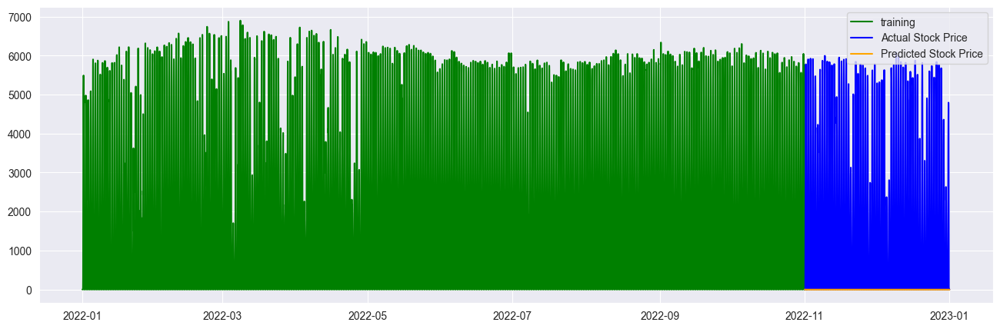

In [38]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot( (ts_train), color='green', label='training')
plt.plot( (ts_test), color = 'blue', label='Actual Stock Price')
plt.plot( fc, color = 'orange',label='Predicted Stock Price')
plt.legend(loc='best')

plt.show()


In [39]:
# report performance
mse = mean_squared_error(ts_test, fc)
print('MSE: '+str(mse))
mae = mean_absolute_error(ts_test, fc)
print('MAE: '+str(mae))
rmse = np.sqrt(mean_squared_error(ts_test, fc))
print('RMSE: '+str(rmse))

results['ARIMA(1,1,1)']=[mae, mse]

MSE: 6430120.198115829
MAE: 1471.7098013479133
RMSE: 2535.7681672652625


In [43]:
triple_xs=ExponentialSmoothing(ts_train+1,  seasonal_periods=5 ,trend='add' , seasonal='mul'
                               ,use_boxcox=True
                               ,initialization_method="estimated"
                              ).fit(optimized=True)

triple_xs.params

/Users/harshayarravarapu/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



{'smoothing_level': 0.9593294854671691,
 'smoothing_trend': 0.00041320404953385095,
 'smoothing_seasonal': 0.016265691462086666,
 'damping_trend': nan,
 'initial_level': 0.009996758613689306,
 'initial_trend': 0.8200299116908137,
 'initial_seasons': array([1.10931459, 1.3185617 , 1.42166109, 1.0571398 , 1.05273632]),
 'use_boxcox': True,
 'lamda': -0.018519833843166605,
 'remove_bias': False}

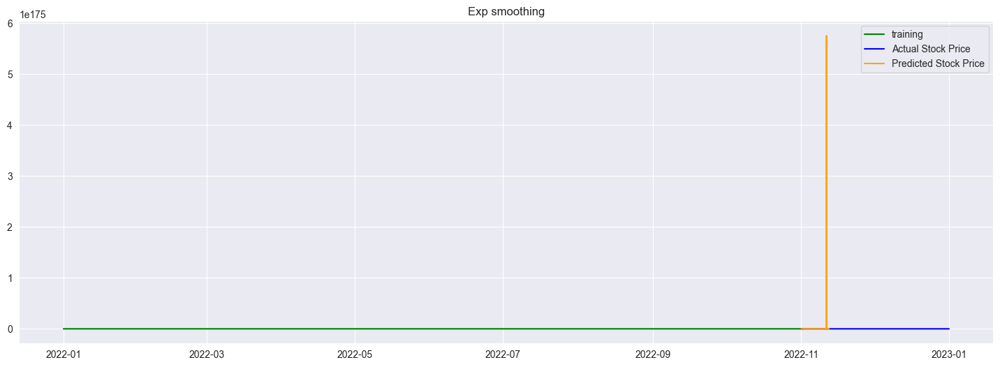

In [44]:
fc_xs=triple_xs.predict( start=ts_test.index[0], end=ts_test.index[-1])

plt.figure(figsize=(18,6), dpi=100)
plt.plot( (ts_train), color='green', label='training')
plt.plot( (ts_test), color = 'blue', label='Actual')
plt.plot( fc_xs, color = 'orange',label='Predicted')
plt.title('Exp smoothing')
plt.legend(loc='best')
plt.show()

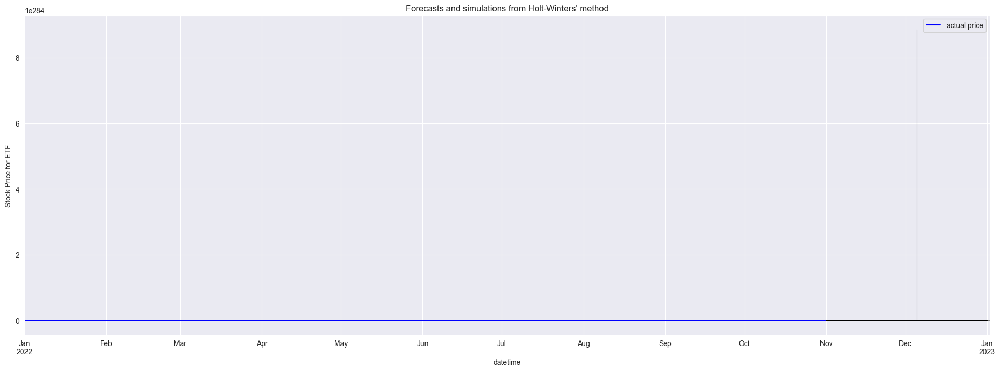

In [45]:
simulations=triple_xs.simulate(len(ts_test), repetitions=300, error='mul',  random_errors='bootstrap')

company='ETF'

ax=ts_train.plot(figsize=(24,8), color='blue', label='actual price',
               title="Forecasts and simulations from Holt-Winters' method" , legend=True)

ax.set_ylabel("Stock Price for {}".format(company))
ax.set_xlabel("Year")




simulations.plot(ax=ax, style='-', alpha=0.05, color='grey', label='simulations', legend=False)



fc_xs.plot(ax=ax, style='--',  color='red', label='forecasting',  legend=0)

#triple_xs.fittedvalues.plot(ax=ax,  color='blue')
ts_test.plot(ax=ax, color='black', label='actual', legend=0)
#plt.legend(loc='best')
plt.show()

In [49]:
# report performance
mse = mean_squared_error(ts_test+1, fc_xs+1)
print('MSE: '+str(mse))
mae = mean_absolute_error(ts_test, fc_xs)
print('MAE: '+str(mae))
rmse = np.sqrt(mean_squared_error(ts_test, fc_xs))
print('RMSE: '+str(rmse))

results['Triple Exponential Smoothing']=[mae, mse]

ValueError: Input contains NaN.

## FB prophet

In [9]:
!pip3 install fbprophet

Defaulting to user installation because normal site-packages is not writeable
  Using cached fbprophet-0.7.1.tar.gz (64 kB)
  Preparing metadata (setup.py) ... done
  Using cached cmdstanpy-0.9.5-py3-none-any.whl (37 kB)
  Using cached pystan-3.7.0-py3-none-any.whl (13 kB)
  Using cached LunarCalendar-0.0.9-py2.py3-none-any.whl (18 kB)
  Using cached convertdate-2.4.0-py3-none-any.whl (47 kB)
  Using cached holidays-0.24-py3-none-any.whl (499 kB)
  Using cached setuptools_git-1.2-py2.py3-none-any.whl (10 kB)
  Using cached PyMeeus-0.5.12-py3-none-any.whl
  Using cached hijri_converter-2.3.1-py3-none-any.whl (13 kB)
  Using cached korean_lunar_calendar-0.3.1-py3-none-any.whl (9.0 kB)
  Using cached ephem-4.1.4-cp39-cp39-macosx_10_9_universal2.whl
  Using cached clikit-0.6.2-py2.py3-none-any.whl (91 kB)
INFO: pip is looking at multiple versions of pystan to determine which version is compatible with other requirements. This could take a while.
  Using cached pystan-3.6.0-py3-none-any.whl

In [6]:
!pip3 install holidays==0.9.12

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 1.7 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
  Created wheel for holidays: filename=holidays-0.9.12-py3-none-any.whl size=47620 sha256=db7b65848e3100cd03ea83119e3a0307ef703d692ba3003e7232bb176dba89f1
  Stored in directory: /Users/harshayarravarapu/Library/Caches/pip/wheels/07/6c/c4/1b24af8edefc8ac6779f5dd0b56c168d5ad7fbf0320b16ddcc
Successfully built holidays


In [10]:
# check prophet version
import fbprophet
# print version number
print('Prophet %s' % fbprophet.__version__)

ModuleNotFoundError: No module named 'fbprophet'